# **<span style='color:Green'>GRASS GIS for remote monitoring of water bodies</span>**


### Abstract

This is a study of how satelte images can be used to monitor water levels on dams and why the tools used for this research were the most effective for the study. It is mentioned that the best plataform to perform this study is jupyter as it contains libraries for grass gis, gdal, matplot and tenserflow so that from just one plataform all can be done. The idea is for the use of satellite images to be imported and downloaded into the folder where the notebook is, unzip it and start working directly with the images using `grass.jupyter` and `grass.script` so that the `.tif` can be transformed into vector and roaster data. Maps are then created and saved as locations within the grass database that the program takes data from to start working on the algorithms that calculate the Normalized Difference Water Index (NDWI).


### Table of contents

1. Abstract
2. GRASS GIS & Satellites
3. Jupyter & Python
5. Set up: Variables and download data
6. Initialization of GRASS GIS in the Jupyter notebook session
7. Importing geodata into GRASS GIS
8. Use of Raster images and vectors for map creation
9. Algorithms
10. Computing NDWI
11. Next steps

### Introduction

### Jupyter and Python

### Set up: Variables and download data



In [101]:
import os
import subprocess
import urllib.request
import zipfile
import sys
import folium
import cv2
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
import matplotlib.animation as animation
from osgeo import gdal
from osgeo import gdal_array
from osgeo.gdalconst import *
import rasterio as rio
from rasterio.plot import show

In [2]:
# data directory
homedir = os.path.join(os.path.expanduser('~\\Documents'), "villadata")

# GRASS GIS database variables
#grassbin = "grassdev"
grassbin = r"C:\OSGeo4W\bin\grass83.bat"
grassdata = os.path.join(homedir, "grassdata")
location = "VillaVictoria"
mapset = "PERMANENT"


In [3]:
#Create a path to save the proj lib so the simulations from interactive maps can run
os.environ['PROJ_DATA'] = 'C:\OSGeo4W\share\proj'

In [4]:
# Sentinel-2 related directories
s2_data = os.path.join(homedir, "sentinel")
s2_timestamps = os.path.join(homedir, s2_data, "sentinel-timestamps.txt")

# create directories if not already existing
os.makedirs(grassdata, exist_ok=True)
os.makedirs(s2_data, exist_ok=True)

# the variables are also accessible via Python
print(homedir)

# list content
os.listdir(homedir)

C:\Users\valte\Documents\villadata


['esa_credentials.txt', 'grassdata', 'sentinel']

In [5]:
grass_python_path = subprocess.check_output([grassbin, "--config", "python_path"], text=True).strip()
sys.path.append(grass_python_path)

# Print the modified sys.path
print("Modified sys.path:")
for path in sys.path:
    print(path)

Modified sys.path:
C:\Users\valte\JupGrass3\grass\doc\notebooks
C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.11_3.11.1264.0_x64__qbz5n2kfra8p0\python311.zip
C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.11_3.11.1264.0_x64__qbz5n2kfra8p0\DLLs
C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.11_3.11.1264.0_x64__qbz5n2kfra8p0\Lib
C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.11_3.11.1264.0_x64__qbz5n2kfra8p0

C:\Users\valte\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages
C:\Users\valte\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\win32
C:\Users\valte\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\win32\lib
C:\Users\valte\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\Lo

### Initialization of GRASS GIS in the Jupyter notebook session


In [6]:
# Import the GRASS GIS packages we need
import grass.script as gs
import grass.jupyter as gj


In [7]:
# Start the GRASS GIS Session
session = gj.init(grassdata, location, mapset)

In [8]:
gs.gisenv()

{'GISDBASE': 'C:\\Users\\valte\\Documents\\villadata\\grassdata',
 'LOCATION_NAME': 'VillaVictoria',
 'MAPSET': 'PERMANENT'}

In [14]:
# Create a new mapset and switch to it
# gs.run_command("g.mapset", mapset="sentinel2", flags="c")

In [9]:
print(gs.read_command("g.mapset", flags="p"))

PERMANENT



In [10]:
# Print accessible mapsets within the location
print(gs.read_command("g.mapsets", flags="p"))

PERMANENT



### Importing geodata into GRASS GIS

Here we add some files to import landsat images from Jupyter


In [11]:


# Specify the input parameters
input_filename = "LC08_L1TP_026047_20220630_20220707_02_T1_refl.TIF"
output_name = "lsatVillaColor"
directory_path = r"C:\Users\valte\Downloads\villalandsat"

# Construct the full path to the input file
input_path = os.path.join(directory_path, input_filename)


# Run the t.rast.import command
gs.run_command("r.import",
               input=input_path,
               output=output_name)


In [47]:
input_filename = "poligono_curva_nivel"
output_name = "polyVilla"
directory_path = r"C:\Users\valte\Downloads\poligono_curva_nivel"


# Construct the full path to the input file
input_path = os.path.join(directory_path, input_filename)

gs.run_command("v.in.ogr",
               input=input_path,
               layer="c_nivel_2570m",
               output=output_name)

In [40]:

# Specify the input parameters
input_filename = "c_nivel_2570m.prj"
output_name = "pixelVilla"
directory_path = r"C:\Users\valte\Downloads"

# Construct the full path to the input file
input_path = os.path.join(directory_path, input_filename)


# Run the t.rast.import command
print(gs.run_command("g.proj",
               wkt=input_path,
               flags="p",
               location="PresaVilla"))


None


### Use of Raster images and vectors for map creation


In [11]:
gs.list_grouped(type="raster")

{'PERMANENT': ['CuencaFinal_2',
  'landsatVilla',
  'lsatVillaColor.1',
  'lsatVillaColor.2',
  'lsatVillaColor.3',
  'x0230904_170025_55_227a_3B_AnalyticMS_8b_clip.1',
  'x0230904_170025_55_227a_3B_AnalyticMS_8b_clip.2',
  'x0230904_170025_55_227a_3B_AnalyticMS_8b_clip.3',
  'x0230904_170025_55_227a_3B_AnalyticMS_8b_clip.4',
  'x0230904_170025_55_227a_3B_AnalyticMS_8b_clip.5',
  'x0230904_170025_55_227a_3B_AnalyticMS_8b_clip.6',
  'x0230904_170025_55_227a_3B_AnalyticMS_8b_clip.7',
  'x0230904_170025_55_227a_3B_AnalyticMS_8b_clip.8']}

In [12]:
gs.list_grouped(type="vector")

{'PERMANENT': ['polyVilla']}

In [13]:
gs.run_command("g.region", raster = "CuencaFinal_2")

In [13]:
gs.core.find_program("i.sentinel.download", "--help")

True

In [89]:
intelev_map = gj.InteractiveMap(width = 700)

In [90]:
intelev_map.add_raster("CuencaFinal_2")
intelev_map.add_vector("polyVilla")
intelev_map.add_layer_control(position = "bottomright")


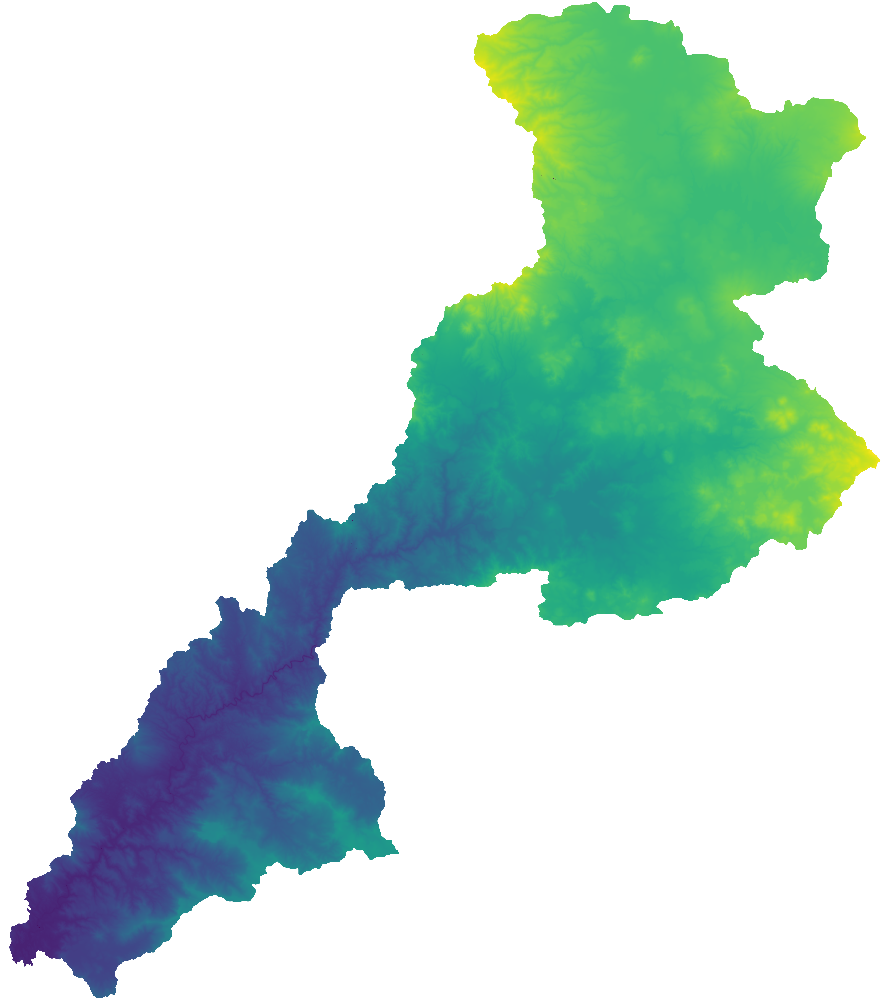

In [92]:
intelev_map.show()

In [56]:
intelev_map.save(filename="intelev_map.html")

In [82]:
elev_map = gj.Map3D()

In [83]:
elev_map.render(elevation_map="CuencaFinal_2", vline="polyVilla", color_map="CuencaFinal_2", perspective=10)


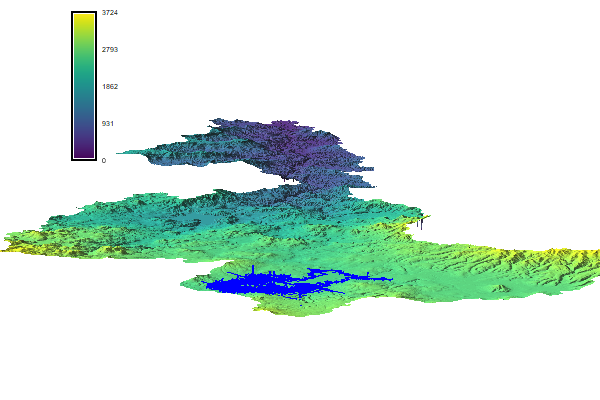

In [84]:
elev_map.overlay.d_legend(raster="CuencaFinal_2", at=(60, 97, 16, 12))
elev_map.show()


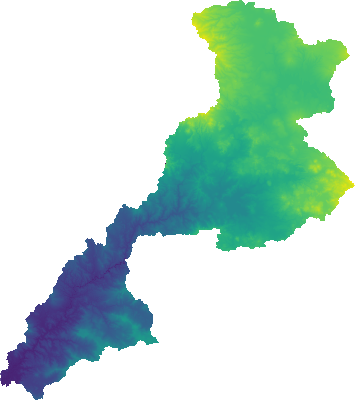

In [10]:
cuenca_map= gj.Map()
cuenca_map.d_rast(map="CuencaFinal_2")
cuenca_map.show()

## Algorithms

### Otsu
The Otsu algorithm is a binarization method often used in image segmentation with bimodal images. Using histograms and statistics to identify key values of the color range between the two colors found in the picture Otsu finds the value in the middle of the two peaks, in the case of figure 1 the value is 2.

<a href="Otsu_thresholding.png">
  <img src="Otsu_thresholding.png"
   width="30%" style="display: block; margin: 0 auto">
</a>
<p style="text-align: center;">(figure 1)</p>

How does Otsu work?
The Otsu algorithm exhaustively (it will try each individual value) searches for a threshold between foreground and background and for that it minimizes the intra-class variance of the two classes which are represented as the weighted sums of variances of the color values of each class. The formula for finding the intra-class variance at any threshold $t$ is given by:

$$
\sigma_{w}^{2}=w_0(t)\sigma_{0}^{2}(t)+w_1(t)\sigma_{1}^{2}(t)
$$

Where the weighted sums $w_0(t)$ and $w_1(t)$ represent the probability of the number of pixels for each class at threshold $t$ and $\sigma^{2}$ represents the variance of color values:

$$
w_0(t)=\sum_{i=0}^{t-1} p_{0}(i)
$$

$$
w_1(t)=\sum_{i=t}^{L-1} p_{1}(i)
$$

$$
\sigma^{2}(t)=\frac{\sum(x_{i}-\bar x)^{2}}{N-1}
$$

The probability being obtained by the formula $p_{0}(i)=\frac{px_{0}(t)}{px_{all}}$, $p_{1}(i)=\frac{px_{1}(t)}{px_{all}}$ <br>
Where, <br>
&ensp;    $px_{0}(i)$ is the count of pixels of the background at threshold $t$ <br>
&ensp;    $px_{1}(i)$  is the count of pixels of the foreground at threshold $t$ <br>
&ensp;    $px_{all}$ is the count of total pixels in the image 

![Alt Text](https://upload.wikimedia.org/wikipedia/commons/3/34/Otsu%27s_Method_Visualization.gif)


### Start the use of Otsu algorithm


We are going to use the default algorithm from the web, but for that we need to first make the images numpy arrays so the Otsu algorithm can read them.

In [5]:
#The otsu algorithm which 
def otsu(img):
    
    assert img is not None, "file could not be read, check with os.path.exists()"
    # global thresholding
    ret1,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
    # Otsu's thresholding
    ret2,th2 = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    # Otsu's thresholding after Gaussian filtering
    blur = cv2.GaussianBlur(img,(5,5),0)
    ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    # plot all the images and their histograms
    images = [img, 0, th1,
     img, 0, th2,
     blur, 0, th3]
    titles = ['Original Noisy Image','Histogram','Global Thresholding (v=127)',
     'Original Noisy Image','Histogram',"Otsu's Thresholding",
     'Gaussian filtered Image','Histogram',"Otsu's Thresholding"]
    for i in range(3):
     plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
     plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
     plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel())
     plt.title(titles[i*3+1])
     plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
     plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
        
    plt.show()

In [67]:
def stretch(img):
    # lo - low value as percentile 0.1 (1/1000 of test values are below lo)
    # hi - high value as percentile 99.9 (1/1000 of test values are above hi)
    lo, hi = np.percentile(img, (0.1, 99.9))
    
    # Apply linear "stretech" - lo goes to 0, and hi goes to 255
    img8 = (img.astype(float) - lo) * (255/(hi-lo))
    
    #Clamp range to [0, 255] and convert to uint8
    img8 = np.maximum(np.minimum(img8, 255), 0).astype(np.uint8)
    
    return img8

Text(0.5, 1.0, 'numpy array from raster')

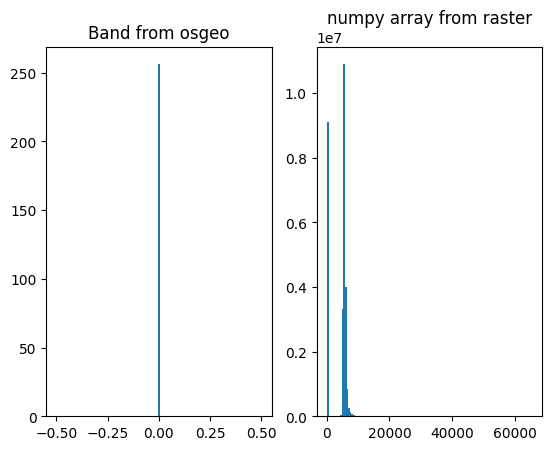

In [68]:
#we use gdal python extension to read the tif images as numpy arrays as gdal already reads them like that.
image_directory = r"C:\Users\valte\Documents\villadata\grassdata\VillaVictoria\Planet\PSScene"
image_file = 'PlanetVBnd8.tif'
input_path = os.path.join(image_directory, image_file)

ds = gdal.Open(input_path, gdal.GA_ReadOnly)
# print(ds.RasterCount)
band1 = ds.GetRasterBand(1)

dsr = rio.open(input_path)
dsr.count
band1r = dsr.read(1)
stretch(band1r)

fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.hist(band1.GetHistogram(), 125)
ax2.hist(band1r.ravel(), 125)

ax1.set_title('Band from osgeo')
ax2.set_title('numpy array from raster')

In [144]:
print(type(myarray))
print('Image dimensions:', myarray.shape)
print(myarray.dtype)
image2 = Image.fromarray(myarray)
print(type(image2))
print(image2.mode)
print(image2.size)

<class 'numpy.ndarray'>
Image dimensions: (4361, 6582)
uint16
<class 'PIL.Image.Image'>
I;16
(6582, 4361)


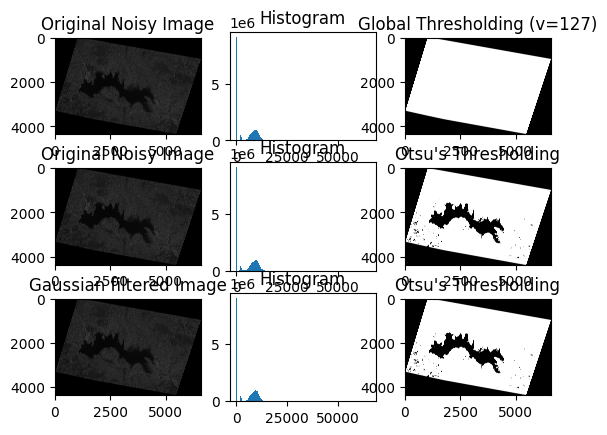

In [59]:
otsu(myarray)

[0, 73041, 2015, 1607, 1356, 1953, 2383, 1948, 1921, 1634, 1905, 1770, 2005, 2030, 2136, 2153, 2357, 2138, 2537, 2538, 2517, 2872, 2706, 3076, 2959, 2976, 3154, 3309, 3087, 3663, 3152, 3792, 3771, 3811, 3610, 4011, 4013, 4440, 3736, 4733, 4415, 4595, 4717, 4299, 5030, 4428, 5257, 4583, 5129, 4798, 5402, 5069, 5546, 5049, 4924, 5769, 5524, 5430, 5663, 5820, 5069, 5819, 5141, 6166, 6123, 4684, 6394, 5915, 5582, 5715, 6521, 5308, 5861, 6027, 5986, 5908, 5473, 6548, 4875, 6212, 6082, 5835, 5916, 5793, 6063, 5700, 6065, 5261, 6218, 5320, 6017, 5571, 5303, 6035, 5272, 5507, 5121, 5720, 5097, 5557, 5146, 5601, 4948, 5220, 5081, 4901, 4995, 5039, 4621, 5016, 4006, 4824, 4686, 4271, 4130, 4302, 4166, 4216, 4139, 3874, 3757, 3979, 3649, 3507, 3906, 3591, 3697, 3395, 3253, 3560, 3658, 3578, 3384, 2986, 3146, 3116, 3915, 2974, 2953, 2799, 2756, 3510, 3315, 2829, 2546, 2640, 2945, 2550, 3160, 2546, 2635, 2755, 2233, 2455, 2817, 2479, 2544, 2261, 2081, 2125, 2590, 2485, 2003, 1932, 1969, 1996, 2448,

Text(0.5, 1.0, 'After applying adaptive range adjustment')

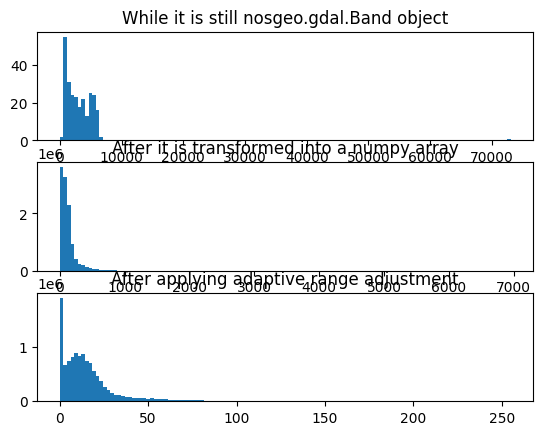

In [93]:

#we use gdal python extension to read the tif images as numpy arrays as gdal already reads them like that.
tif_directory = r"C:\Users\valte\Documents\villadata\grassdata\VillaVictoria\Planet\Planet3\PSScene"
tif_file = '20230914_162320_95_2415_3B_AnalyticMS_SR_8b_clip.tif'
input_path2 = os.path.join(tif_directory, tif_file)
ds2 = gdal.Open(input_path2, gdal.GA_ReadOnly)

band1 = ds2.GetRasterBand(1)
band2 = ds2.GetRasterBand(2)
band3 = ds2.GetRasterBand(3)
band4 = ds2.GetRasterBand(4)
band5 = ds2.GetRasterBand(5)
band6 = ds2.GetRasterBand(6)
band7 = ds2.GetRasterBand(7)
band8 = ds2.GetRasterBand(8)

print(band1.GetHistogram())
print(band1.AsMDArray().GetShape())

#print(band1.ComputeRasterMinMax())
#print(band8.ComputeRasterMinMax())

b1 = band1.ReadAsArray() #Interoperable with Sentinel-2 band 1 
b2 = band2.ReadAsArray() #Interoperable with Sentinel-2 band 2
b3 = band3.ReadAsArray()
b4 = band4.ReadAsArray() #Interoperable with Sentinel-2 band 3
b5 = band5.ReadAsArray()
b6 = band6.ReadAsArray() #Interoperable with Sentinel-2 band 4
b7 = band7.ReadAsArray() #Interoperable with Sentinel-2 band 5
b8 = band8.ReadAsArray() #Interoperable with Sentinel-2 band 8a

coastal_blue = stretch(b1)  #Interoperable with Sentinel-2 band 1 
blue = stretch(b2)  #Interoperable with Sentinel-2 band 2
green1 = stretch(b3)
green = stretch(b4) #Interoperable with Sentinel-2 band 3
yellow = stretch(b5)
red = stretch(b6) #Interoperable with Sentinel-2 band 4
red_edge = stretch(b7) #Interoperable with Sentinel-2 band 5
NIR = stretch(b8) #Interoperable with Sentinel-2 band 8a

fig, (ax1, ax2, ax3) = plt.subplots(3, 1)

# Plots
ax1.hist(band1.GetHistogram(), 125)
ax2.hist(b1.ravel(), 125)
ax3.hist(coastal_blue.ravel(), 125)

ax1.set_title('While it is still nosgeo.gdal.Band object')
ax2.set_title('After it is transformed into a numpy array')
ax3.set_title('After applying adaptive range adjustment')



In [90]:
cv2.namedWindow("band8_before", cv2.WINDOW_NORMAL)
cv2.namedWindow("band8_after", cv2.WINDOW_NORMAL)
#Display images before and after linear "stretech":
cv2.imshow('band8_before', b8)
cv2.imshow('band8_after', NIR)
cv2.waitKey(0)
cv2.destroyAllWindows()

print(np.unique(b8))
print(np.unique(NIR))

[    0   188   198 ... 16995 17081 17312]
[  0   8   9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24
  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42
  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60
  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78
  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96
  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114
 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132
 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150
 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168
 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186
 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204
 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222
 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240
 241 242 

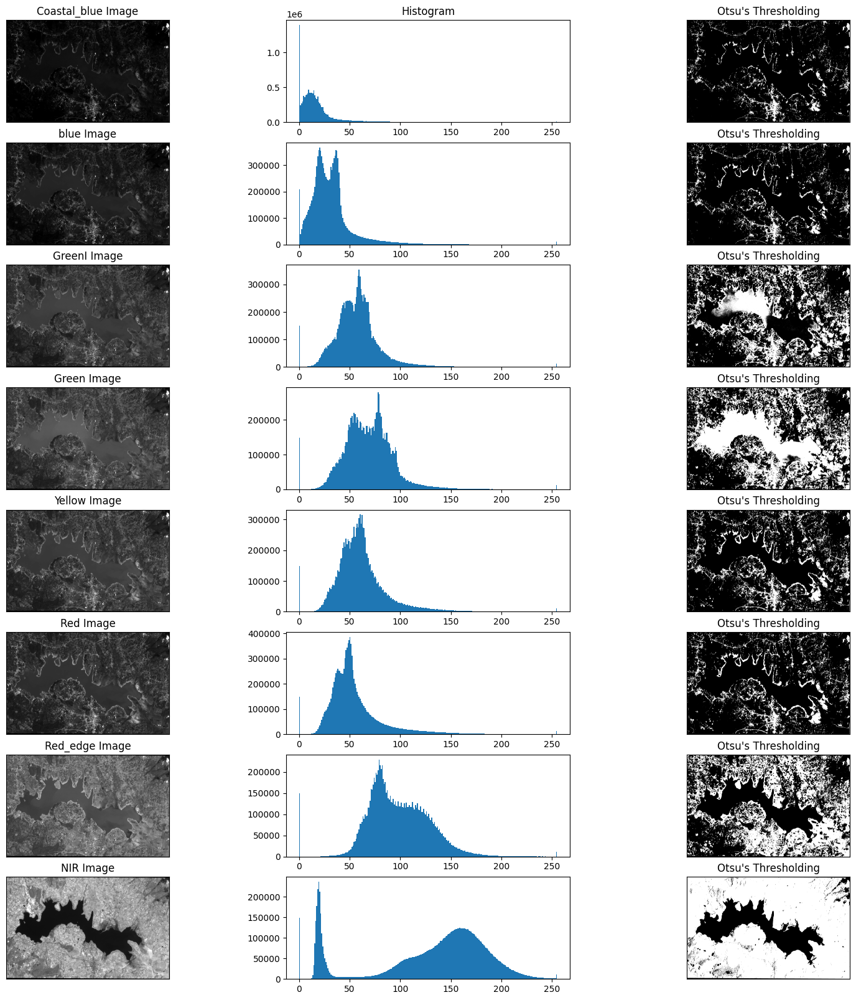

In [87]:
img1 = coastal_blue
img2 = blue
img3 = green1
img4 = green
img5 = yellow
img6 = red
img7 = red_edge
img8 = NIR

ret1,th1 = cv2.threshold(img1,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret2,th2 = cv2.threshold(img2,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret3,th3 = cv2.threshold(img3,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret4,th4 = cv2.threshold(img4,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret5,th5 = cv2.threshold(img5,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret6,th6 = cv2.threshold(img6,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret7,th7 = cv2.threshold(img7,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret8,th8 = cv2.threshold(img8,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

images = [img1, 0, th1,
          img2, 0, th2,
          img3, 0, th3,
          img4, 0, th4,
          img5, 0, th5,
          img6, 0, th6,
          img7, 0, th7,
          img8, 0, th8]

titles = ['Coastal_blue Image','Histogram',"Otsu's Thresholding",
          'blue Image',' ',"Otsu's Thresholding",
          'GreenI Image',' ',"Otsu's Thresholding",
          'Green Image',' ',"Otsu's Thresholding",
          'Yellow Image',' ',"Otsu's Thresholding",
          'Red Image',' ',"Otsu's Thresholding",
          'Red_edge Image',' ',"Otsu's Thresholding",
          'NIR Image',' ',"Otsu's Thresholding"]

fig=plt.figure(figsize=(20,20), dpi= 100, facecolor='w', edgecolor='k')

for i in range(8):
 plt.subplot(8,3,i*3+1),plt.imshow(images[i*3],'gray')
 plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
 plt.subplot(8,3,i*3+2),plt.hist(images[i*3].ravel(), 256)
 plt.title(titles[i*3+1])
 plt.subplot(8,3,i*3+3),plt.imshow(images[i*3+2],'gray')
 plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])